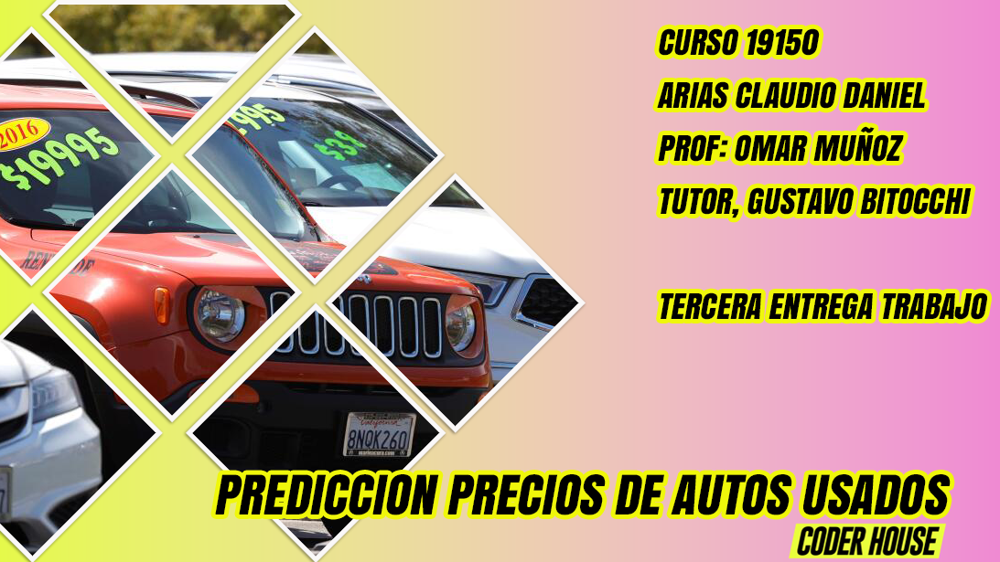

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
<hr/>
<div class="list-group">

***Prediccion Precio Autos***

<span id="0"></span>
[Dataset obtenido de](https://www.kaggle.com/)
<hr/>
<font color=green>

    
1. [Overview](#1)    
1. [Data clearing e importación de Datos](#2)   
1. [EDA con Visualización de Datos ](#3)
1. [BoxPlot para detectar outliers](#4)
1. [Correlación Matrix](#5)  
1. [Heatmap ](#6)
1. [Conclusión de Mapa de Calor](#7)
1. [ScatterPlot](#8)
1. [Bar Plot](#9)
1. [Pie Chart](#10)    
1. [Data_Profiling](#11)    
1. [Modeling and Prediction](#12)
1. [Splitting the dataset](#13)
1. [Predictive Modeling](#14)
1. [Linear Regression](#15)
1. [Support Vector Machine](#16)
1. [Random Forest](#17)  
1. [Conclusión de las metricas](#18)
1. [Interpretación](#19)    
1. [Conclusion del dataset](#20)

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
<span id="1"></span> 

### Overview
El presente trabajo se trata de predecir el precio de coches usados en USA  
Contexto
    
Lo que nos lleva a preguntarnos    
¿Qué determina el precio de los coches usados?


Entendemos que el valor de un automóvil cae desde el momento en que se compra y la depreciación continúa con cada año que pasa. De hecho, en el primer año, el valor de un automóvil disminuye en un 20 por ciento de su valor inicial. La marca y el modelo de un automóvil, el total de kilómetros recorridos, el estado general del vehículo y varios otros factores afectan aún más el valor de reventa del automóvil
    
El dataset presenta 16 atributos numericos y categoricos que nos serviran de guia para establecer el algoritmo necesario para su predicción
Al final del trabajo, enunciamos los atributos que le faltarían al presente dataset, para optimizar los resultados y que modelos de negocios están relacionados con el presente trabajo

    
    
[Return Contents](#0)
<hr/>



  <button type="button" class="list-group-item list-group-item-action active">
    Dataset Caracteristicas
  </button>
  <button type="button" class="list-group-item list-group-item-action"> Numero de Atributos : 16 numericas/categoricas predictivas</button>
  <button type="button" class="list-group-item list-group-item-action">make : fabricante del auto</button>
  <button type="button" class="list-group-item list-group-item-action">model: modelo del auto</button>
  <button type="button" class="list-group-item list-group-item-action">year : año de frabricacion del auto</button>
  <button type="button" class="list-group-item list-group-item-action">engine_fuel_type : tipo de combustible que necesita</button>
  <button type="button" class="list-group-item list-group-item-action">engine_hp : caballos de fuerza del motor</button>
  <button type="button" class="list-group-item list-group-item-action">engine_cilynders : numeros de cilindro en el motor     </button>
  <button type="button" class="list-group-item list-group-item-action">transmission_type : tipo de transmision del auto</button>
  <button type="button" class="list-group-item list-group-item-action">driven_wheels : rueda motriz, la que transmite la fuerza (tracción delantera, trasera, o todas)</button>
  <button type="button" class="list-group-item list-group-item-action">numbers_of_doors : número de puertas que tiene el auto</button>
  <button type="button" class="list-group-item list-group-item-action">market_category : categoría de venta del auto</button>
  <button type="button" class="list-group-item list-group-item-action">vehicle_size : categoria de tamaño del auto     </button>
  <button type="button" class="list-group-item list-group-item-action">vehicle_style : estilo del auto </button>
  <button type="button" class="list-group-item list-group-item-action">highway_mpg : millas por galon en la carretera     </button>
  <button type="button" class="list-group-item list-group-item-action">city_mpg : millas por galon en la ciudad     </button>
  <button type="button" class="list-group-item list-group-item-action">popularity : numero de veces que se menciono en twitter     </button>
  <button type="button" class="list-group-item list-group-item-action">MSRP : precio sugerido por el fabricante     </button>





















<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="2"></span> 

### Data Cleaning e importación de datos
    
La limpieza de datos o limpieza de datos es el proceso de detectar y corregir (o eliminar) registros corruptos o inexactos de un conjunto de registros, tabla o base de datos y se refiere a identificar partes incompletas, incorrectas, inexactas o irrelevantes de los datos y luego reemplazar, modificar, o eliminando los datos sucios o gruesos.
    
    
[Return Contents](#0)
<hr/>

In [24]:
#Pandas y Numpy para manipulación de datos
import pandas as pd
import pandas_profiling
import numpy as np
#Para visualización
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import missingno as msno
from IPython.display import display, Markdown
from funpymodeling.exploratory import profiling_num
from funpymodeling.exploratory import status
from funpymodeling.exploratory import freq_tbl
import warnings
warnings.simplefilter("ignore")

# Standard machine learning models
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC

# Scikit-learn utilities
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from pgmpy.models import BayesianModel
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import f1_score, confusion_matrix, roc_auc_score, roc_curve, accuracy_score
from sklearn.linear_model import LogisticRegression

#PyMC3 for Bayesian Interference
import pymc3 as pm
#importación de bibliotecas para usar las funciones
import itertools
pd.options.mode.chained_assignment = None

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [25]:
df = pd.read_csv("C://Users//claud//Downloads//data.csv")
#df contiene la información del archivo que está en formato csv
#normalizo las columnas en "_" y en minúsculas
df.columns = df.columns.str.lower().str.replace(" ", "_")
string_columns = list(df.dtypes[df.dtypes =="object"].index)
for col in string_columns:
    df[col].str.lower().str.replace(" ","_") 

In [26]:
# Calculate the accuracy and f1 score of a model
def calc_metrics(predictions, y_test):
    accuracy = np.mean(predictions == y_test)
    f1_metric = f1_score(y_test, predictions)

    print('Accuracy of Model: {:.2f}%'.format(100 * accuracy))
    print('F1 Score of Model: {:.4f}'.format(f1_metric))

In [27]:
df

,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,market_category,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50920


<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="3"></span> 
Exploremos el conjunto de datos para tener una mejor comprensión de los datos.   
    
### **EDA con Visualización de Datos** 

El análisis exploratorio de datos se refiere al proceso crítico de realizar investigaciones iniciales sobre los datos para descubrir patrones, detectar anomalías, probar hipótesis y verificar suposiciones con la ayuda de estadísticas resumidas y representaciones gráficas.

La visualización de datos es la representación gráfica de datos para transmitir información de forma interactiva y eficiente a los clientes, clientes y partes interesadas en general.

#### Box plot for outliers
En estadística descriptiva, un diagrama de caja es un método para representar gráficamente grupos de datos numéricos a través de sus cuartiles. Los diagramas de caja también pueden tener líneas que se extienden verticalmente desde las cajas (bigotes) que indican la variabilidad fuera de los cuartiles superior e inferior, de ahí los términos diagrama de caja y patillas y diagrama de caja y patillas. Los valores atípicos se pueden trazar como puntos individuales

[Return Contents](#0)
<hr/>


In [28]:
df.columns
#enumeración de los nombres de columna del  dataset/dataframe

Index(['make', 'model', 'year', 'engine_fuel_type', 'engine_hp',
       'engine_cylinders', 'transmission_type', 'driven_wheels',
       'number_of_doors', 'market_category', 'vehicle_size', 'vehicle_style',
       'highway_mpg', 'city_mpg', 'popularity', 'msrp'],
      dtype='object')

In [29]:
df.dtypes

#comprobando los tipos de datos de diferentes columnas del dataframe

make                  object
model                 object
year                   int64
engine_fuel_type      object
engine_hp            float64
engine_cylinders     float64
transmission_type     object
driven_wheels         object
number_of_doors      float64
market_category       object
vehicle_size          object
vehicle_style         object
highway_mpg            int64
city_mpg               int64
popularity             int64
msrp                   int64
dtype: object

In [30]:
df.info()
#obteniendo la información del dataframe como nro. de entradas, columnas de datos, recuento de nulos, tipos de datos, etc.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   make               11914 non-null  object 
 1   model              11914 non-null  object 
 2   year               11914 non-null  int64  
 3   engine_fuel_type   11911 non-null  object 
 4   engine_hp          11845 non-null  float64
 5   engine_cylinders   11884 non-null  float64
 6   transmission_type  11914 non-null  object 
 7   driven_wheels      11914 non-null  object 
 8   number_of_doors    11908 non-null  float64
 9   market_category    8172 non-null   object 
 10  vehicle_size       11914 non-null  object 
 11  vehicle_style      11914 non-null  object 
 12  highway_mpg        11914 non-null  int64  
 13  city_mpg           11914 non-null  int64  
 14  popularity         11914 non-null  int64  
 15  msrp               11914 non-null  int64  
dtypes: float64(3), int64(5

In [31]:
df.shape
#forma del marco de datos, es decir, nro. de filas y columnas

(11914, 16)

In [32]:
df.describe()
#comprobación de resumen estadístico como recuento, media, etc. de columnas numéricas

,year,engine_hp,engine_cylinders,number_of_doors,highway_mpg,city_mpg,popularity,msrp
count,11914.000000,11845.00000,11884.000000,11908.000000,11914.000000,11914.000000,11914.000000,1.191400e+04
mean,2010.384338,249.38607,5.628829,3.436093,26.637485,19.733255,1554.911197,4.059474e+04
std,7.579740,109.19187,1.780559,0.881315,8.863001,8.987798,1441.855347,6.010910e+04
min,1990.000000,55.00000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,170.00000,4.000000,2.000000,22.000000,16.000000,549.000000,2.100000e+04
50%,2015.000000,227.00000,6.000000,4.000000,26.000000,18.000000,1385.000000,2.999500e+04
75%,2016.000000,300.00000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.223125e+04
max,2017.000000,1001.00000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


In [33]:
df.drop(df[df['msrp'] == 0].index,inplace=True)
#quitar filas que tienen cero como valor para la columna MSRP, ya que es nuestra variable dependiente/objetivo.

In [34]:
df.shape

(11914, 16)

<AxesSubplot:>

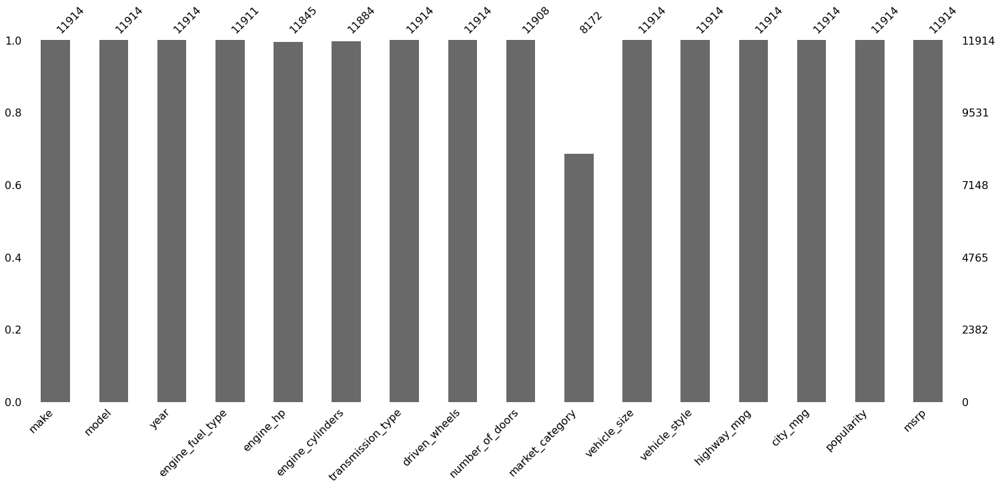

In [35]:
msno.bar(df)

In [36]:
df.drop(['market_category'], axis=1, inplace=True)
#decidimos borrar'market category' ya que el MSRP es independiente y, por lo tanto, no es útil para predecir el precio del automóvil. 

In [37]:
df.shape

(11914, 15)

In [38]:
df.duplicated().sum()
#comprobando si hay duplicados en el dataframe

720

In [39]:
df.drop_duplicates(keep=False,inplace=True)
#eliminando los duplicados en los datos

In [40]:
df

,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,50920


In [41]:
df.isnull().sum()
#comprobando cualquier valor nulo en los datos

make                  0
model                 0
year                  0
engine_fuel_type      3
engine_hp            69
engine_cylinders     30
transmission_type     0
driven_wheels         0
number_of_doors       6
vehicle_size          0
vehicle_style         0
highway_mpg           0
city_mpg              0
popularity            0
msrp                  0
dtype: int64

In [42]:
df.dropna(inplace=True,axis=0)
#removiendo los valores nulos en los datos

In [43]:
df.isnull().sum()
#verificación de cualquier valor nulo que haya quedado

make                 0
model                0
year                 0
engine_fuel_type     0
engine_hp            0
engine_cylinders     0
transmission_type    0
driven_wheels        0
number_of_doors      0
vehicle_size         0
vehicle_style        0
highway_mpg          0
city_mpg             0
popularity           0
msrp                 0
dtype: int64

<AxesSubplot:>

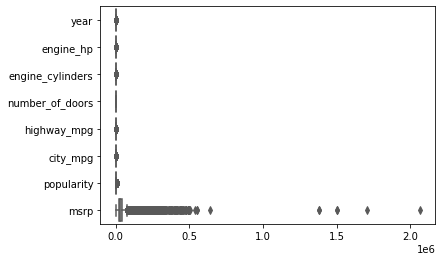

In [44]:
sns.boxplot(data=df,orient='h',palette='Set2')
#comprobando si hay valores atípicos en los datos

In [45]:
df.drop(df[df['msrp'] >= 500000].index,inplace=True)
#eliminar los puntos de datos innecesarios del dataset

<AxesSubplot:xlabel='msrp'>

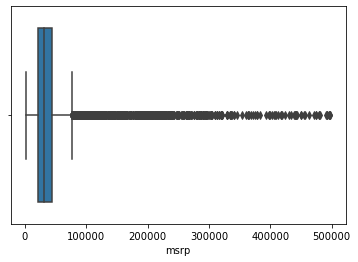

In [46]:
sns.boxplot(x=df['msrp'])

<AxesSubplot:xlabel='engine_cylinders'>

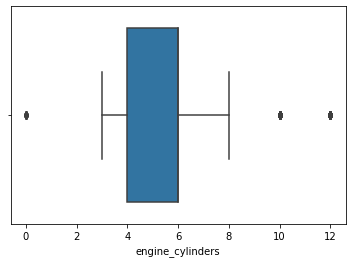

In [47]:
sns.boxplot(x=df['engine_cylinders'])

<AxesSubplot:xlabel='engine_hp'>

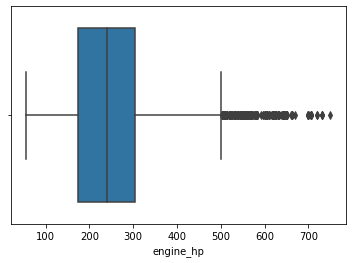

In [48]:
sns.boxplot(x=df['engine_hp'])

In [49]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

year                    9.00
engine_hp             130.00
engine_cylinders        2.00
number_of_doors         2.00
highway_mpg             8.00
city_mpg                7.00
popularity           1460.00
msrp                21793.75
dtype: float64


In [50]:
df = df[~((df < (Q1 - 1.5*IQR))|(df > (Q3 + 1.5*IQR))).any(axis = 1)]
df.shape

(8206, 15)

In [51]:
counts=df['make'].value_counts()*100/sum(df['make'].value_counts())
#calculando porcentaje de cada marca

In [52]:
popular_labels=counts.index[:10]

colors=['lightslategray',]*len(popular_labels)
colors[0]='crimson'

fig=go.Figure(data=[go.Bar(x=counts[:10],y=popular_labels,marker_color=colors,orientation='h')])
fig.update_layout(title_text='Marcas de coches más representadas en el Dataset',xaxis_title="Porcentaje",yaxis_title="Marca de auto")
#plotting de las 10 marcas principales representadas en el dataset

In [53]:
prices = df[['make','msrp']].loc[(df['make'].isin(popular_labels))].groupby('make').mean()
print(prices)
#calcular el precio promedio de las 10 mejores marcas representadas en el dataset

                   msrp
make                   
Cadillac   50509.370130
Chevrolet  28546.168327
Dodge      26178.358722
GMC        33666.516199
Honda      27038.467018
Infiniti   43384.618750
Mazda      20628.445040
Nissan     28559.636542
Suzuki     18295.844037
Toyota     28759.360000


<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="4"></span> 
    
#### Boxplot
        
Los diagramas de caja(boxplot) son una medida de qué tan bien distribuidos están los datos en un conjunto de datos. Divide el conjunto de datos en tres cuartiles. Este gráfico representa el mínimo, el máximo, la mediana, el primer cuartil y el tercer cuartil del conjunto de datos.
    
[Return Contents](#0)
<hr/>

In [54]:
display_p=df[['make','year','msrp']].loc[(df['make'].isin(popular_labels))]

fig=px.box(display_p,x="make",y="msrp")
fig.update_layout(title_text='Precio promedio de las 10 marcas de coches más representativas',xaxis_title="Marca",yaxis_title="Precio promedio")

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="5"></span>
    
#### Correlation matrix
Los coeficientes de correlación cuantifican la asociación entre variables o características de un conjunto de datos. Estas estadísticas son de gran importancia para la ciencia y la tecnología, y Python tiene excelentes herramientas que puede usar para calcularlas. Los métodos de correlación de SciPy, NumPy y Pandas son rápidos, completos y están bien documentados.

La matriz de correlación se puede utilizar para estimar la relación histórica lineal entre los rendimientos de múltiples activos. Puede utilizar el integrado. corr() en un DataFrame de pandas para calcular fácilmente la matriz de correlación. La correlación varía de -1 a 1.
[Return Contents](#0)

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="6"></span>

#### Heatmap
Un mapa de calor es una representación gráfica de datos en la que los valores de datos se representan como colores. Es decir, utiliza el color para comunicar un valor al lector. Esta es una gran herramienta para ayudar a la audiencia a identificar las áreas más importantes cuando se tiene un gran volumen de datos.
    
[Return Contents](#0)
<hr/>

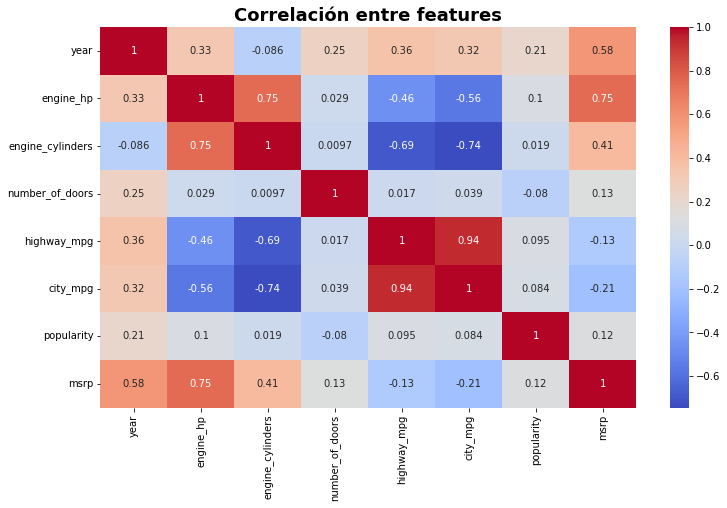

In [55]:
df_corr=df.corr()
f,ax=plt.subplots(figsize=(12,7))
sns.heatmap(df_corr,cmap='coolwarm',annot=True)
plt.title("Correlación entre features",weight='bold',fontsize=18)
plt.show()

#trazando el mapa de calor para diferentes features

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="7"></span>

### **Conclusión Mapa de calor**    
2.1 Del mapa de calor anterior, podemos concluir que:

2.1.1 >> El precio depende en gran medida de las características Caballos de fuerza (HP) y Año

2.1.2 >> Además, las funciones HP y Cilindros dependen positivamente entre sí. es decir, si no. de cilindros aumentan, HP también aumenta.


2.1.3 >> Y las características Highway_MPG-H y City_MPG dependen negativamente de los cilindros
es decir, si no. de cilindros aumentan, Highway_MPG-H y City_MPG disminuyen.
    
[Return Contents](#0)
<hr/>

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="8"></span>
    
#### Scatterplot
Los diagramas de dispersión se utilizan para trazar puntos de datos en los ejes horizontal y vertical en un intento de mostrar cuánto afecta una variable a otra. Cada fila en la tabla de datos está representada por un marcador, la posición depende de sus valores en las columnas establecidas en los ejes X e Y.
    
    
[Return Contents](#0)
<hr/>

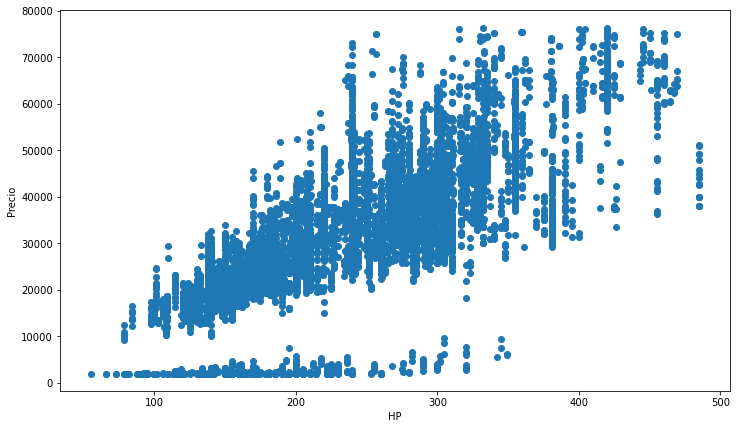

In [56]:
fig,ax = plt.subplots(figsize=(12,7))
ax.scatter(df['engine_hp'],df['msrp'])
ax.set_xlabel('HP')
ax.set_ylabel('Precio')
plt.show()

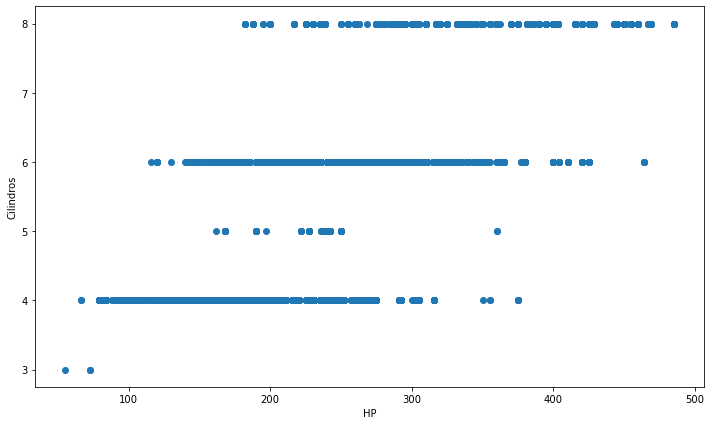

In [57]:
fig,ax = plt.subplots(figsize=(12,7))
ax.scatter(df['engine_hp'],df['engine_cylinders'])
ax.set_xlabel('HP')
ax.set_ylabel('Cilindros')
plt.show()

In [58]:
#creamos una nueva columna 'Rango de precios' para una fácil visualización
def getrange(Precio):
    if (Precio >= 0 and Precio < 25000):
        return '0 - 25000'
    if (Precio >= 25000 and Precio < 50000):
        return '25000 - 50000'
    if (Precio >= 50000 and Precio < 75000):
        return '50000 - 75000'
    if (Precio >= 75000 and Precio < 100000):
        return '75000 - 100000'
    if (Precio >= 100000 and Precio < 500000):
        return '100000 - 500000'
       
df['Rango_Precio'] = df.apply(lambda x:getrange(x['msrp']),axis = 1)

df['Rango_Precio'].value_counts()

25000 - 50000     4460
0 - 25000         2827
50000 - 75000      895
75000 - 100000      24
Name: Rango_Precio, dtype: int64

In [59]:
#distribución del número de coches a lo largo de los años
dic = {1990+i : sum(df['year']==1990+i) for i in range(28)}
x_dic = [1990 + i for i in range(28)]
y_dic = [dic[1990 + i] for i in range(28)]

# Plot
fig = go.Figure([go.Bar(x=x_dic, y=y_dic)])

fig.update_layout(title="Distribución de autos por año",
                  xaxis_title="Año",
                  yaxis_title="Cant Autos vendidos")


fig.show()

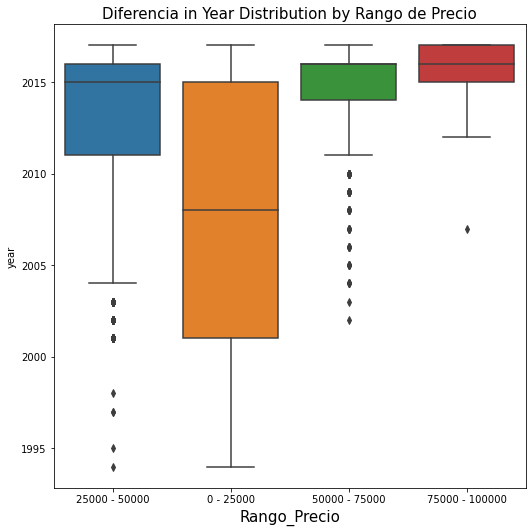

In [60]:
plt.figure(tight_layout = True, figsize = (7.5,7.5))
sns.boxplot(x = df.Rango_Precio, y = df.year)
plt.title('Diferencia in Year Distribution by Rango de Precio', fontsize = 15)
plt.xlabel('Rango_Precio', fontsize = 15)
plt.show()

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="9"></span>

#### Bar plot
Un diagrama de barras o gráfico de barras es un cuadro o gráfico que presenta datos categóricos con barras rectangulares con alturas o longitudes proporcionales a los valores que representan. Las barras se pueden trazar vertical u horizontalmente. Un gráfico de barras muestra comparaciones entre categorías discretas.

[Return Contents](#0)
<hr/>

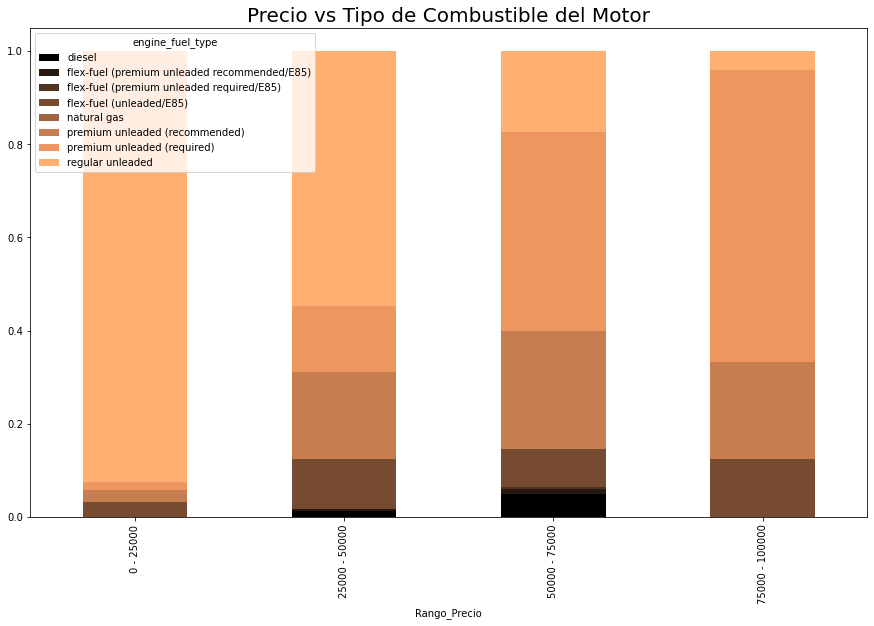

In [61]:
plt.rcParams['figure.figsize'] = (15,9)

x = pd.crosstab(df['Rango_Precio'],df['engine_fuel_type'])
color = plt.cm.copper(np.linspace(0,1,9))
x.div(x.sum(1).astype(float),axis = 0).plot(kind = 'bar',stacked = True ,color=color)
plt.title("Precio vs Tipo de Combustible del Motor",fontweight = 30,fontsize = 20)
plt.show()

#REGULAR UNLEADED ES 92 OCTANOS REGULAR SIN PLOMO
# PREEMIUM UNLEADED PRMIUM SIN PLOMO

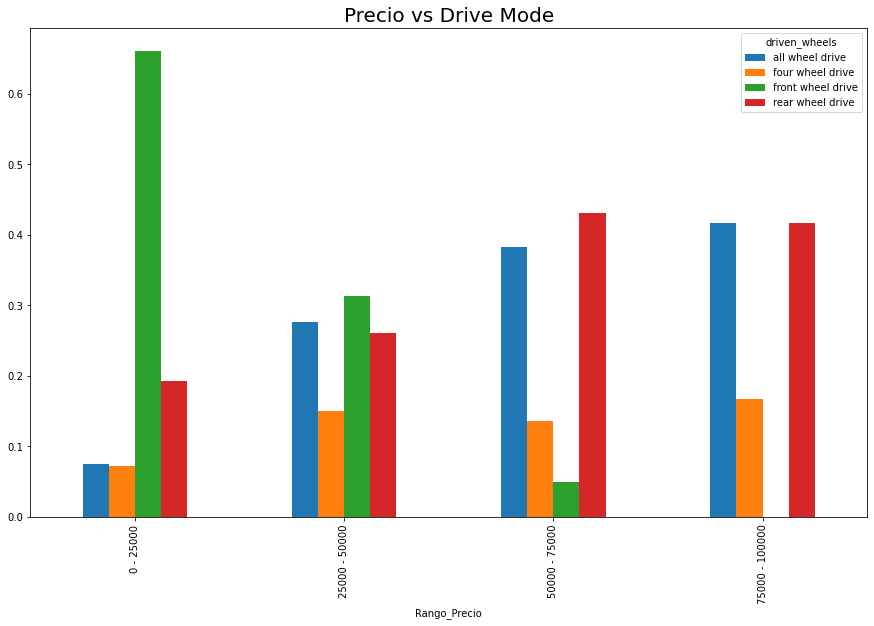

In [62]:
plt.rcParams['figure.figsize'] = (15,9) #ES TRACCION EN LAS CUATRO RUEDAS O TRACCION DELANTERA O TRASERA
x = pd.crosstab(df['Rango_Precio'],df['driven_wheels'])
x.div(x.sum(1).astype(float),axis = 0).plot(kind = 'bar',stacked = False)
plt.title('Precio vs Drive Mode',fontweight = 30,fontsize = 20)
plt.show()

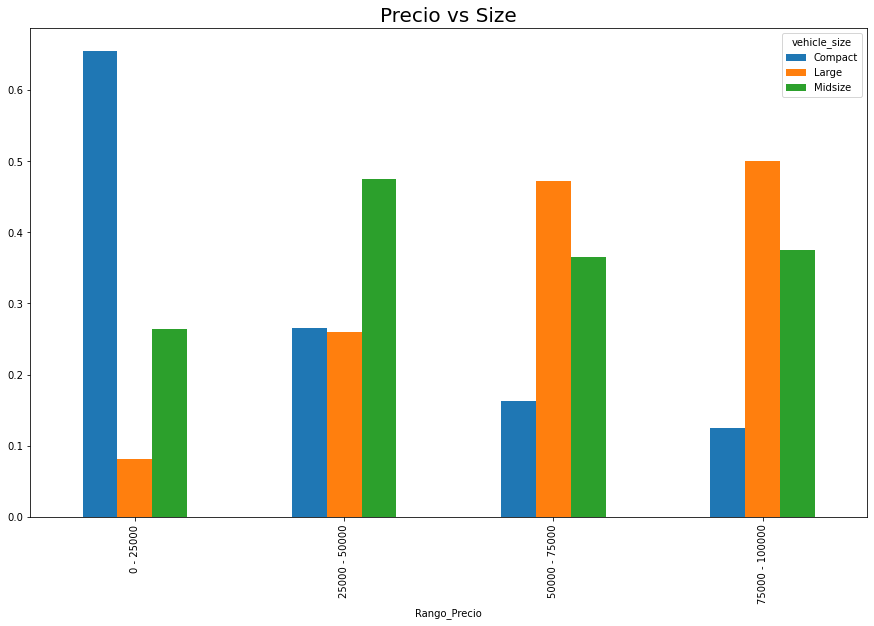

In [63]:
plt.rcParams['figure.figsize'] = (15,9)
x = pd.crosstab(df['Rango_Precio'],df['vehicle_size'])
x.div(x.sum(1).astype(float),axis = 0).plot(kind = 'bar',stacked = False)
plt.title('Precio vs Size',fontweight = 30,fontsize = 20)
plt.show()

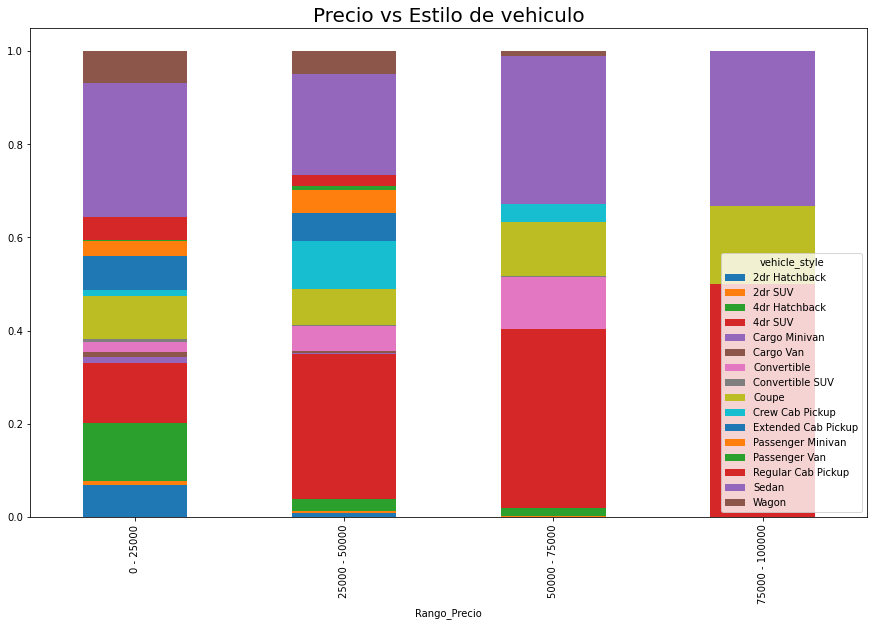

In [64]:
plt.rcParams['figure.figsize'] = (15,9)

x = pd.crosstab(df['Rango_Precio'],df['vehicle_style'])
x.div(x.sum(1).astype(float),axis = 0).plot(kind = 'bar',stacked = True)
plt.title("Precio vs Estilo de vehiculo",fontweight = 30,fontsize = 20)
plt.show()

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="10"></span>

#### Pie Chart
Un gráfico circular es un tipo de visualización de datos que se utiliza para ilustrar proporciones numéricas en los datos. La biblioteca de python 'matplotlib' proporciona muchas herramientas útiles para crear hermosas visualizaciones, incluidos gráficos circulares.
    
[Return Contents](#0)
<hr/>

In [65]:
data_pie = df['transmission_type'].value_counts()

fig = go.Figure(data=[go.Pie(labels=data_pie.index, values=data_pie.tolist(), textinfo='label+percent',insidetextorientation='radial')])

fig.update_traces(hole=.3, hoverinfo="label+percent+name")

In [66]:
df.head(5).style.background_gradient(cmap='coolwarm')

,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp,Rango_Precio
0,BMW,1 Series M,2011,premium unleaded (required),335.000000,6.000000,MANUAL,rear wheel drive,2.000000,Compact,Coupe,26,19,3916,46135,25000 - 50000
1,BMW,1 Series,2011,premium unleaded (required),300.000000,6.000000,MANUAL,rear wheel drive,2.000000,Compact,Convertible,28,19,3916,40650,25000 - 50000
2,BMW,1 Series,2011,premium unleaded (required),300.000000,6.000000,MANUAL,rear wheel drive,2.000000,Compact,Coupe,28,20,3916,36350,25000 - 50000
3,BMW,1 Series,2011,premium unleaded (required),230.000000,6.000000,MANUAL,rear wheel drive,2.000000,Compact,Coupe,28,18,3916,29450,25000 - 50000
4,BMW,1 Series,2011,premium unleaded (required),230.000000,6.000000,MANUAL,rear wheel drive,2.000000,Compact,Convertible,28,18,3916,34500,25000 - 50000


<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="11"></span>
    
#### Data_Profiling   

[Return Contents](#0)
<hr/>

In [67]:
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [68]:
df.shape

(8206, 16)

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="12"></span>
    
## **Modelling and Prediction**
Label Encoding
    

La codificación de etiquetas se refiere a convertir las etiquetas en forma numérica para convertirlas en una forma legible por máquina. Los algoritmos de aprendizaje automático pueden decidir de una mejor manera cómo se deben operar esas etiquetas. Es un paso importante de preprocesamiento para el conjunto de datos estructurados en el aprendizaje supervisado.
    
[Return Contents](#0)
<hr/>

In [69]:
# realizar la codificación de etiquetas en las columnas categóricas
columns_to_convert=['make','model','engine_fuel_type','transmission_type','driven_wheels','vehicle_size','vehicle_style','Rango_Precio']
df[columns_to_convert] = df[columns_to_convert].astype('category')

In [70]:
df.dtypes

make                 category
model                category
year                    int64
engine_fuel_type     category
engine_hp             float64
engine_cylinders      float64
transmission_type    category
driven_wheels        category
number_of_doors       float64
vehicle_size         category
vehicle_style        category
highway_mpg             int64
city_mpg                int64
popularity              int64
msrp                    int64
Rango_Precio         category
dtype: object

In [71]:
from sklearn import preprocessing
  
# label_encoder object sabe como interpretar las etiquetas de las palabras
label_encoder = preprocessing.LabelEncoder()
  
#.
for col in ['make','model','engine_fuel_type','transmission_type','driven_wheels','vehicle_size','vehicle_style','Rango_Precio']: df[col] = label_encoder.fit_transform(df[col])

In [72]:
df.head().style.background_gradient(cmap='coolwarm')

,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp,Rango_Precio
0,3,1,2011,6,335.000000,6.000000,2,3,2.000000,0,8,26,19,3916,46135,1
1,3,0,2011,6,300.000000,6.000000,2,3,2.000000,0,6,28,19,3916,40650,1
2,3,0,2011,6,300.000000,6.000000,2,3,2.000000,0,8,28,20,3916,36350,1
3,3,0,2011,6,230.000000,6.000000,2,3,2.000000,0,8,28,18,3916,29450,1
4,3,0,2011,6,230.000000,6.000000,2,3,2.000000,0,6,28,18,3916,34500,1


In [73]:
# dividimos las variables dependientes e independientes

x = df[['popularity','year','engine_hp','engine_cylinders','highway_mpg','city_mpg']].values
y = df['msrp'].values

print(x.shape)
print(y.shape)

(8206, 6)
(8206,)


In [74]:
#normalizando los datos
from sklearn.preprocessing import StandardScaler
sc_x=StandardScaler()
sc_y=StandardScaler()

x=sc_x.fit_transform(x)
y=sc_y.fit_transform(y.reshape(-1,1))

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="13"></span>
    
#### Splitting the dataset
Por lo general, separamos un conjunto de datos en un conjunto de entrenamiento y un conjunto de prueba, la mayoría de los datos se usan para el entrenamiento y una porción más pequeña de los datos se usa para la prueba. Analysis Services muestrea aleatoriamente los datos para ayudar a garantizar que los conjuntos de prueba y entrenamiento sean similares.
    
#### [Return Contents](#0)
<hr/>

In [75]:
# dividimos el dataset en conjuntos de entrenamiento y prueba

from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state = 0)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(6564, 6)
(6564, 1)
(1642, 6)
(1642, 1)


<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="14"></span>
    
#### Predictive Modelling
El modelado predictivo es una forma poderosa de agregar inteligencia a su aplicación. Permite que las aplicaciones predigan resultados contra nuevos datos. El acto de incorporar análisis predictivos en sus aplicaciones implica dos fases principales: entrenamiento de modelos e implementación de modelos.

[Return Contents](#0)
<hr/>

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="15"></span>
    
#### Linear Regression
La regresión lineal es un tipo de análisis predictivo básico y de uso común. La idea general de la regresión es examinar dos cosas:

(1) ¿un conjunto de variables predictoras hace un buen trabajo al predecir una variable de resultado (dependiente)?

(2) ¿Qué variables en particular son predictores significativos de la variable de resultado y de qué manera, indicados por la magnitud y el signo de las estimaciones beta, afectan la variable de resultado?

Estas estimaciones de regresión se utilizan para explicar la relación entre una variable dependiente y una o más variables independientes.
    
[Return Contents](#0)
<hr/>

In [76]:
from sklearn.linear_model import LinearRegression

lr_model = LinearRegression()
lr_model.fit(x_train,y_train)

# calculating the accuracies
print("Training Accuracy :",lr_model.score(x_train,y_train))
print("Testing Accuracy :",lr_model.score(x_test,y_test))

Training Accuracy : 0.687571734802348
Testing Accuracy : 0.6786663195731562


In [77]:
y_pred = lr_model.predict(x_test)
y_pred[0:5]

array([[-0.03834104],
       [-0.53358267],
       [-0.26599389],
       [-0.19866208],
       [-0.33739642]])

Text(0, 0.5, 'Valores predecidos')

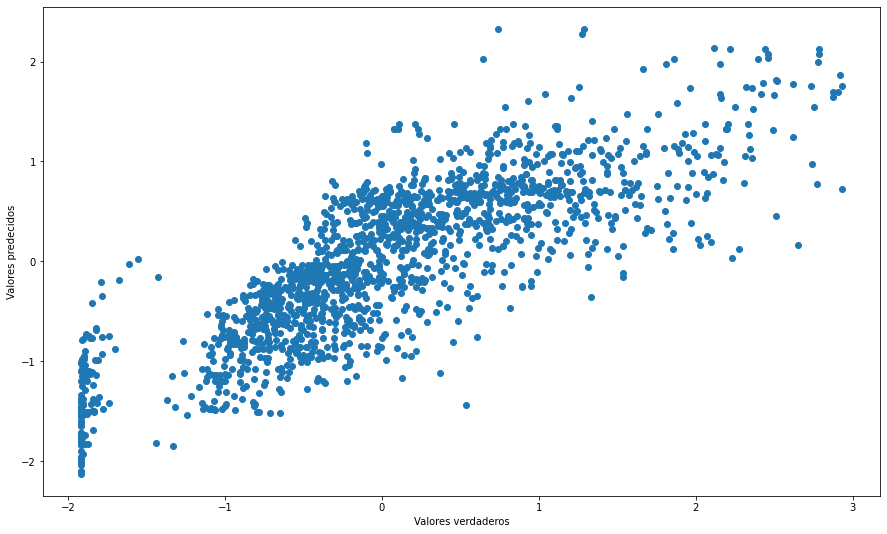

In [78]:
plt.scatter(y_test,y_pred)
plt.xlabel("Valores verdaderos")
plt.ylabel("Valores predecidos")


<AxesSubplot:ylabel='Density'>

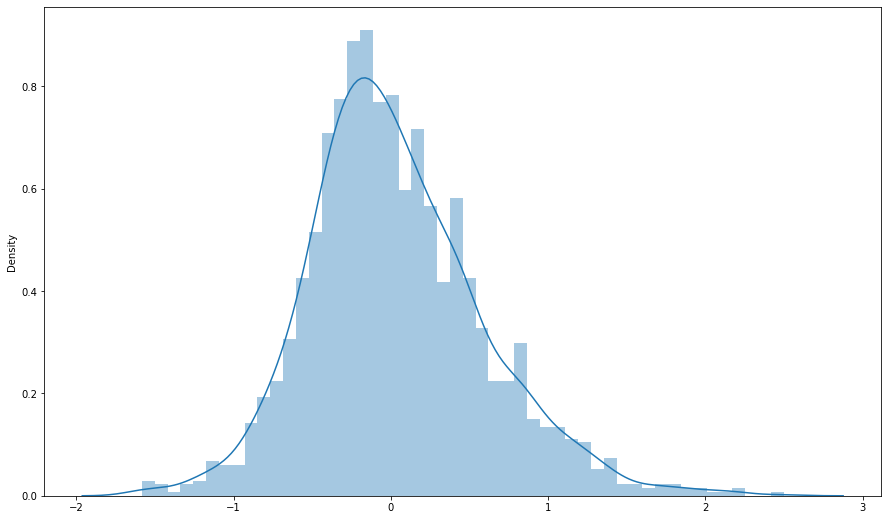

In [79]:
sns.distplot((y_test-y_pred),bins=50)

In [80]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
import math

print("R2_Score           : ", r2_score(y_test,y_pred))
print("Mean Squared Error : ", mean_squared_error(y_test,y_pred))
print("MAE                : ",mean_absolute_error(y_test,y_pred))
print("RSME               : ",math.sqrt(mean_squared_error(y_test,y_pred)))

R2_Score           :  0.6786663195731562
Mean Squared Error :  0.3096743662311746
MAE                :  0.42699366382544685
RSME               :  0.5564839316918097


In [81]:
results_df = pd.DataFrame(data=[["Linear Regression", lr_model.score(x_train,y_train),lr_model.score(x_test,y_test),r2_score(y_test,y_pred),mean_squared_error(y_test,y_pred),mean_absolute_error(y_test,y_pred),math.sqrt(mean_squared_error(y_test,y_pred))]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %','r2 score','MSE','MAE','RSME'])

results_df

,Model,Training Accuracy %,Testing Accuracy %,r2 score,MSE,MAE,RSME
0,Linear Regression,0.687572,0.678666,0.678666,0.309674,0.426994,0.556484


Feature: 0, Score: 0.00000
Feature: 1, Score: 12.44483
Feature: 2, Score: 0.00000
Feature: 3, Score: -0.00000
Feature: 4, Score: 93.32225
Feature: 5, Score: 86.50811
Feature: 6, Score: 26.74607
Feature: 7, Score: 3.28535
Feature: 8, Score: -0.00000
Feature: 9, Score: 0.00000


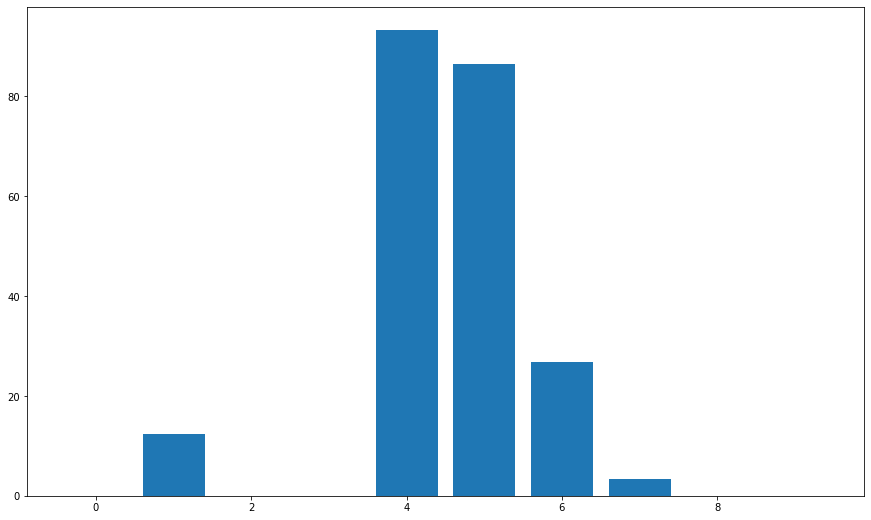

In [100]:
# linear regression feature importance
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot
# define dataset
x, y = make_regression(n_samples=1000, n_features=10, n_informative=5, random_state=1)
# define the model
model = LinearRegression()
# fit the model
model.fit(x, y)
# get importance
importance = model.coef_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="16"></span>
    
#### Support Vector Machine
La "Support Vector Machine" (SVM) es un algoritmo de aprendizaje automático supervisado que se puede usar para desafíos de clasificación o regresión. Sin embargo, se utiliza principalmente en problemas de clasificación. En el algoritmo SVM, trazamos cada elemento de datos como un punto en un espacio n-dimensional (donde n es el número de características que tiene) y el valor de cada característica es el valor de una coordenada particular.
    
[Return Contents](#0)
<hr/>

In [ ]:
from sklearn.svm import SVR
svr_model=SVR(kernel = 'rbf')
svr_model.fit(x_train,y_train)

# calculando los accuracies
print("Training Accuracy :",svr_model.score(x_train,y_train))
print("Testing Accuracy :",svr_model.score(x_test,y_test))

In [ ]:
y_pred = svr_model.predict(x_test)
y_pred[0:5]

Text(0, 0.5, 'Valores predecidos')

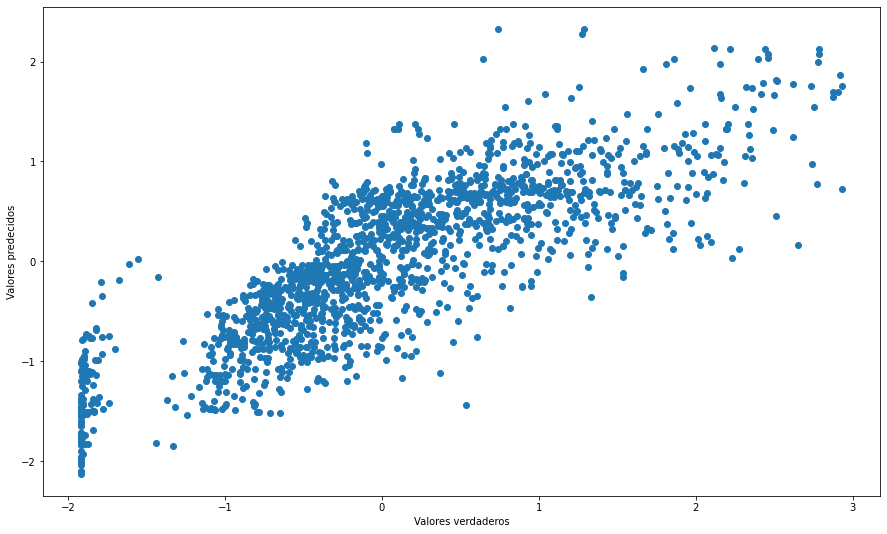

In [83]:
plt.scatter(y_test,y_pred)
plt.xlabel("Valores verdaderos")
plt.ylabel("Valores predecidos")

<AxesSubplot:ylabel='Density'>

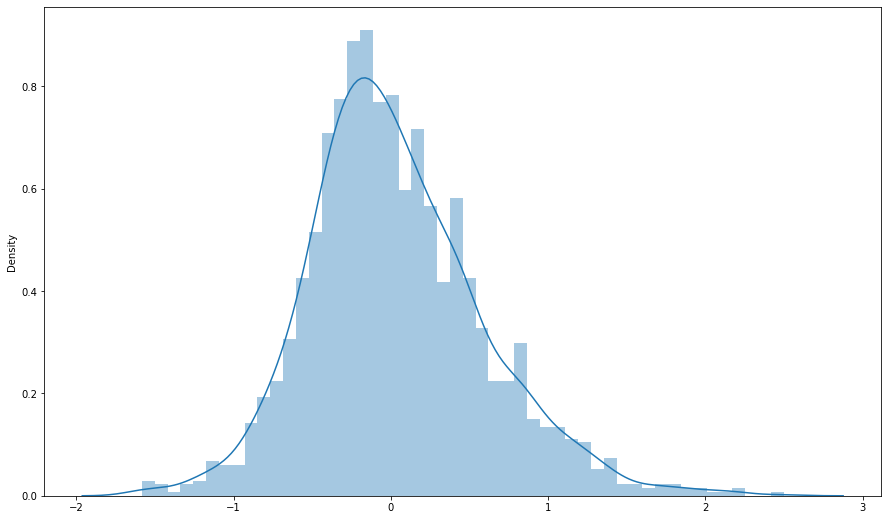

In [84]:
sns.distplot((y_test-y_pred),bins=50)

In [85]:
print("R2_Score           : ", r2_score(y_test,y_pred))
print("Mean Squared Error : ", mean_squared_error(y_test,y_pred))
print("MAE                : ",mean_absolute_error(y_test,y_pred))
print("RSME               : ",math.sqrt(mean_squared_error(y_test,y_pred)))

R2_Score           :  0.6786663195731562
Mean Squared Error :  0.3096743662311746
MAE                :  0.42699366382544685
RSME               :  0.5564839316918097


<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="17"></span>
    
#### Random Forest
Random Forest es como un algoritmo de arranque con el modelo de árbol de decisión (CART). Digamos que tenemos 1000 observaciones en la población completa con 10 variables. Random forest intenta construir múltiples modelos CART con diferentes muestras y diferentes variables iniciales. Por ejemplo, tomará una muestra aleatoria de 100 observaciones y 5 variables iniciales elegidas al azar para construir un modelo CART. Repetirá el proceso (digamos) 10 veces y luego hará una predicción final sobre cada observación. La predicción final es una función de cada predicción. Esta predicción final puede ser simplemente la media de cada predicción.
    
[Return Contents](#0)
<hr/>

In [86]:
from sklearn.ensemble import RandomForestRegressor

rfc_model=RandomForestRegressor(n_estimators=300,random_state=0)
rfc_model.fit(x_train,y_train)

# calculando accuracies
print("Training Accuracy :",rfc_model.score(x_train,y_train))
print("Testing Accuracy :",rfc_model.score(x_test,y_test))

Training Accuracy : 0.9684892893971475
Testing Accuracy : 0.931982258531506


In [87]:
y_pred = rfc_model.predict(x_test)
y_pred[0:5]

array([ 0.76168658, -0.78565117, -0.13410491, -0.45295718, -0.16596576])

In [88]:
#prediccion sobre el test data
y_test_pred = rfc_model.predict(x_test)

#Hypertuning utilizando grid search,
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor 

random_forest = RandomForestRegressor() #Instanciamos el modelo que es regresor no clasificador

#Definimos los parámetros de búsqueda  IMPORTAMOS GridSearchCV y Random Forest Regressor
params = {
    'n_estimators' : [100, 200, 500],
    'max_features': [2,3]  #nros de columnas 3x2= 6 experimentos que va a realizar
}
# Es una grilla de parámetros es CV (cross Validation) porque es un método de validación cruzada  
# para evitar el sobreajuste o subajuste de los modelos ,overfiting
# y lo guardamos en grid_random_forest 
grid_random_forest = GridSearchCV(estimator = random_forest,
                                  param_grid = params,
                                  scoring = 'neg_mean_absolute_error',  # estimación metrica
                                  cv = 5, #validación cruzada
                                  verbose = 1, #Muestra el resultado en pantalla
                                  n_jobs = 6) # cantidad de procesadores que corren en paralelo
#en n_jobs con -1 corren todos los procesadores, se nos recomendo usar 6 para que no colapse
#la computadora mientras entrena

#Entrenamos el modelo
grid_random_forest.fit(x_train, y_train)
# en este caso va a ejecutar todas las iteraciones que indicamos arriba y serán 6 modelos,
#como en CV pusimos 5 , va a partir los datos en 5 grupos o sea va a tener = 30 modelos

#Obtenemos el mejor resultado!
grid_random_forest.best_score_

#Obtenemos el mejor modelo!
grid_random_forest.best_estimator_

#Obtenemos el mejor parámetro
grid_random_forest.best_params_

#Predicción de casos nuevos
grid_random_forest.predict(x_train)
grid_random_forest.predict(x_test)





Fitting 5 folds for each of 6 candidates, totalling 30 fits


array([ 0.74681269, -0.78291337, -0.11319696, ...,  1.81486449,
       -0.68260354,  0.02008012])

In [89]:
#Entrenamos el modelo
grid_random_forest.fit(x_train, y_train)
# en este caso va a ejecutar todas las iteraciones que indicamos arriba y serán 6 modelos,
#como en CV pusimos 5 , va a partir los datos en 5 grupos o sea va a tener = 30 modelos

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=6,
             param_grid={'max_features': [2, 3],
                         'n_estimators': [100, 200, 500]},
             scoring='neg_mean_absolute_error', verbose=1)

In [90]:
#Obtenemos el mejor modelo!
grid_random_forest.best_estimator_

RandomForestRegressor(max_features=3, n_estimators=500)

In [91]:
#Predicción de casos nuevos
grid_random_forest.predict(x_train)
grid_random_forest.predict(x_test)

array([ 0.73638306, -0.78105978, -0.09835663, ...,  1.82437257,
       -0.67884258,  0.01190973])

Text(0, 0.5, 'Valores predecidos')

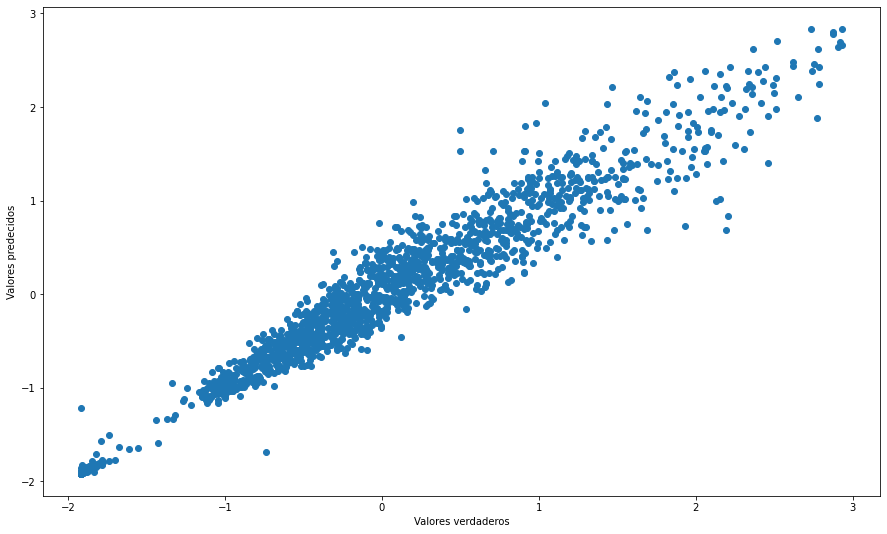

In [92]:
plt.scatter(y_test,y_pred)
plt.xlabel("Valores verdaderos")
plt.ylabel("Valores predecidos")

<AxesSubplot:ylabel='Density'>

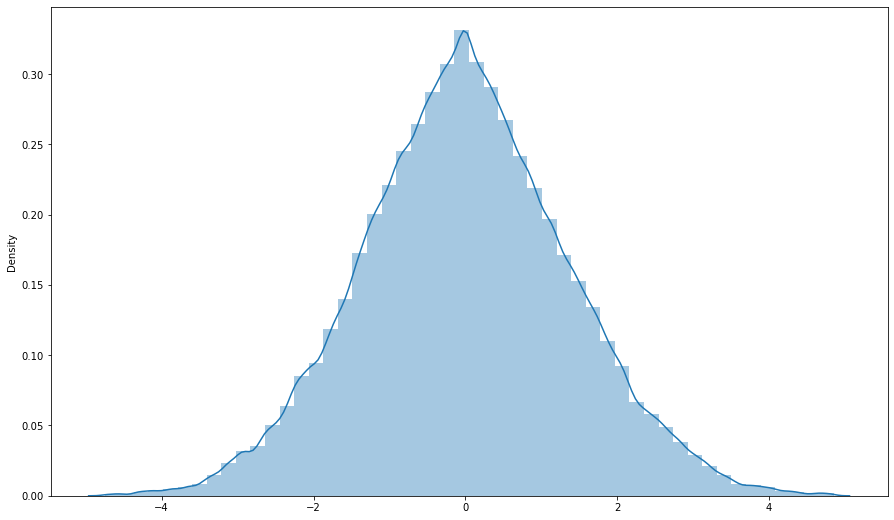

In [93]:
sns.distplot((y_test-y_pred),bins=50)

In [94]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [95]:
print("R2_Score           : ", r2_score(y_test,y_pred))
print("Mean Squared Error : ", mean_squared_error(y_test,y_pred))
print("MAE                : ",mean_absolute_error(y_test,y_pred))
print("RSME               : ",math.sqrt(mean_squared_error(y_test,y_pred)))

R2_Score           :  0.931982258531506
Mean Squared Error :  0.06554977664884755
MAE                :  0.1835031799860902
RSME               :  0.25602690610333817


In [96]:
results_df_2 = pd.DataFrame(data=[["Random Forest", rfc_model.score(x_train,y_train),rfc_model.score(x_test,y_test),
                                   r2_score(y_test,y_pred),mean_squared_error(y_test,y_pred),mean_absolute_error(y_test,y_pred),
                                   math.sqrt(mean_squared_error(y_test,y_pred))]], 
                                  
                            columns=['Model', 'Training Accuracy %', 'Testing Accuracy %','r2 score','MSE','MAE','RSME'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %,r2 score,MSE,MAE,RSME
0,Linear Regression,0.687572,0.678666,0.678666,0.309674,0.426994,0.556484
1,Random Forest,0.968489,0.931982,0.931982,0.065550,0.183503,0.256027


Feature: 0, Score: 0.00309
Feature: 1, Score: 0.00529
Feature: 2, Score: 0.00288
Feature: 3, Score: 0.00270
Feature: 4, Score: 0.53059
Feature: 5, Score: 0.42086
Feature: 6, Score: 0.02564
Feature: 7, Score: 0.00309
Feature: 8, Score: 0.00306
Feature: 9, Score: 0.00279


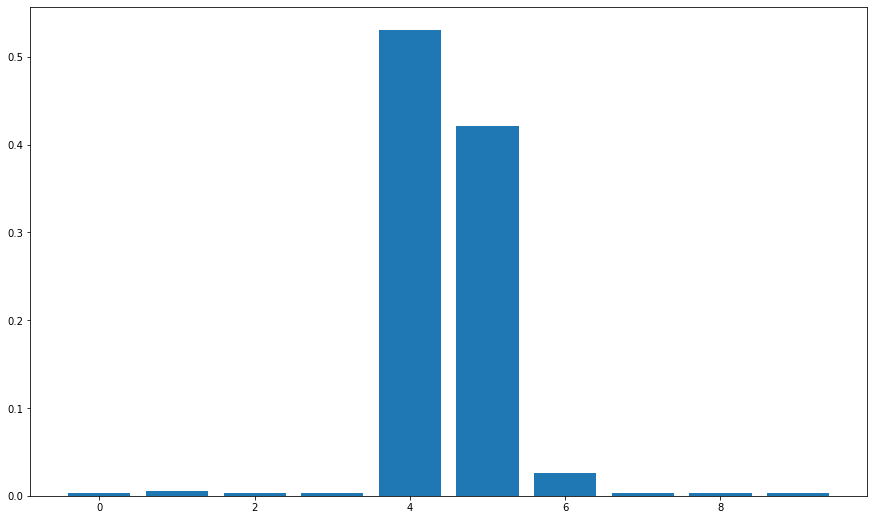

In [97]:
# random forest for feature importance on a regression problem
from sklearn.datasets import make_regression
from sklearn.ensemble import RandomForestRegressor
from matplotlib import pyplot
# define dataset
X, y = make_regression(n_samples=1000, n_features=10, n_informative=5, random_state=1)
# define the model
model = RandomForestRegressor()
# fit the model
model.fit(X, y)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [101]:
##KFold - Train y Test
from sklearn.model_selection import KFold
KFold = KFold(n_splits=5, random_state=0, shuffle=True)
train, test = list(KFold.split(x))[0]
x_train = x[train]
x_test = x[test]
y_train = y[train]
y_test = y[test]

In [102]:
#Entrenar arbol y encontrar el mejor alpha con GridSearchCV y KFold
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
t = DecisionTreeRegressor()
par = list(np.arange(0.0, 1., step=0.05))
cv = KFold(n_splits=5, random_state=0, shuffle=True)
tunner = GridSearchCV(estimator=t, param_grid={'ccp_alpha':par}, cv=cv)
_=tunner.fit(x_train, y_train)

In [103]:
print('Train score KFold Tree: ' + str(tunner.score(x_train, y_train)))
print('Test score KFold Tree : ' + str(tunner.score(x_test, y_test)))

Train score KFold Tree: 0.9992516859779943
Test score KFold Tree : 0.9226888146587113


Feature: 0, Score: 0.00277
Feature: 1, Score: 0.00521
Feature: 2, Score: 0.00261
Feature: 3, Score: 0.00178
Feature: 4, Score: 0.51727
Feature: 5, Score: 0.43743
Feature: 6, Score: 0.02733
Feature: 7, Score: 0.00187
Feature: 8, Score: 0.00275
Feature: 9, Score: 0.00097


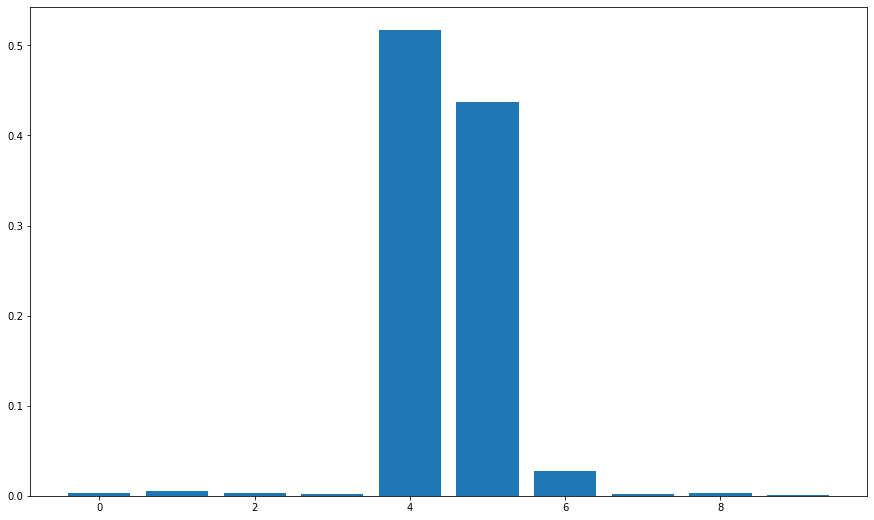

In [104]:
# decision tree for feature importance on a regression problem
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot
# define dataset
x, y = make_regression(n_samples=1000, n_features=10, n_informative=5, random_state=1)
# define the model
model = DecisionTreeRegressor()
# fit the model
model.fit(x, y)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="18"></span>

#### Conclusión de las metricas    
Entonces, de la tabla anterior, el algoritmo más adecuado para el conjunto de datos proporcionado es "Random Forest" con una precisión del "96 %".
    
[Return Contents](#0)
<hr/>

<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
# <span id="19"></span>
    
#### Interpretaciones de las metricas
    
Al analizar las métricas obtenidas, podemos identificar que los valores en Train y Test, son parecidos y significativamente altos. A continuación se detallan los resultados alcanzados:

* Train score KFold Tree: 0.9992516859779943
* Test score KFold Tree : 0.9226888146587113

[Return Contents](#0)
<hr/>    


<nav class="navbar navbar-dark bg-primary">
<div class="alert alert-block alert-info">
<span id="20"></span> 
<span style='color:black'>  </span>

#### Conclusión del trabajo
recomendaciones
* en la indexación del dataset
luego de tener la entrada correctamente formateada se procede a su indexación, encontrar el Grupo de Versiones al cual pertenece, para así poder utilizar el Clan de Versiones asociado en la predicción. Dicho de otra manera, se le asigna un Grupo de Versiones a una entrada para saber que otras versiones de distintos años de ese modelo son compatibles con
él, pudiendo así utilizar todas las entradas que pertenecen al Clan en la construcción del predictor.
    
* El dataset para mejorar la eficiencia en la predidción sería deseable que se pudiera conseguir más atributos,
    Para determinar el precio por desgaste de materiales por ejemplo con estos parámetros ya se podría estimar:
1. Año de publicación del vehículo (año en que fue ingresada la entrada a la base de
datos).
2. Año de salida al mercado del vehículo.
3. Kilometraje.
4. Combustible (0 si es nafta, 1 si es diésel).
5. Transmisión (0 si es manual, 1 si es automático).
6. Tracción (0 si es 4x2, 1 si es 4x4).
7. Precio.
  
* El mantenimiento a través del tiempo de grupos y clanes
Dado que todos los años se agregan nuevos modelos de autos al mercado, que pueden ser completamente nuevos, o una nueva versión de uno ya existente en el dataset, esto sugiere que una vez al año, se debe realizar mantenimiento a los clanes definidos el año anterior



    
[Return Contents](#0)
<hr/>

####y en que se podría implementar ????

A modo de ejemplo, les traigo una interfáz gráfica de un proyecto de una aplicación web de chile con similares características en los atributos utilizados


Para la interfaz gráfica del proyecto, se construyó una aplicación web utilizando el frame-work Angular , la cual cuenta con dos vistas: la de ingreso de datos y la de muestra de resultados. La primera otorga la posibilidad de ingresar los datos de Las entradas de marca, modelo y año son listas de opciones. La primera es una lista que muestra todas las marcas disponibles, la segunda es una lista que muestra los modelos de los autos asociados a la marca escogida en la entrada anterior y la tercera es una lista que muestra los años posibles de la combinación marca y modelo escogida en las entradas anteriores. De esta forma se obliga al usuario a ingresar datos válidos, dicho de otra manera, restringe al usuario a ingresar un trío marca, modelo y año consistente. La información de estas listas son obtenidas a través de solicitudes GET sucesivas al backend. Al detectarse un cambio en el dato de la marca, se hace una solicitud al backend para obtener los modelos de esa marca. Luego, al detectarse un cambio en el dato del modelo, se hace una solicitud para obtener los años en los que ese modelo ha sido lanzado. l vehículo a tasar de dos formas diferentes: por patente y kilometraje o por marca, modelo, año y kilometraje. Por defecto, la forma de ingreso es la primera mencionada, como se puede observar en la Figura . Si se desea utilizar la otra forma de ingreso de datos, se debe presionar la frase “O si prefieres, busca tu auto por marca y modelo” para que los inputs cambien a como se puede apreciar en la Figura 


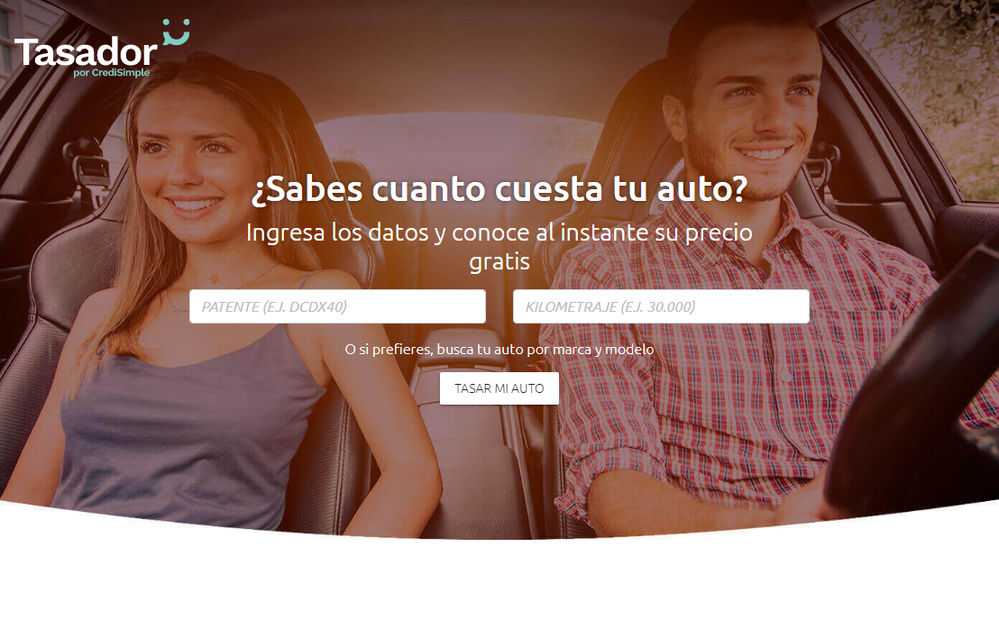

Vista de ingreso de patente y kilometraje
































[Return Contents](#0)
<hr/>




El siguiente paso en el flujo es escoger la versión específica del vehículo a tasar, información que es clave para el proceso de predicción como fue explicado en las secciones anteriores. Para esto, independiente de si la información fue ingresada de una u otra forma, se debe presionar el botón “TASAR MI AUTO” que abrirá una ventana de diálogo modal con todas las versiones existentes en la base de datos sobre ese auto. Esta lista de versiones es también obtenida a través de una solicitud GET al backend (que se dispara al apretar el botón) enviando como parámetro la patente o la marca, el modelo y el año, según corresponda.



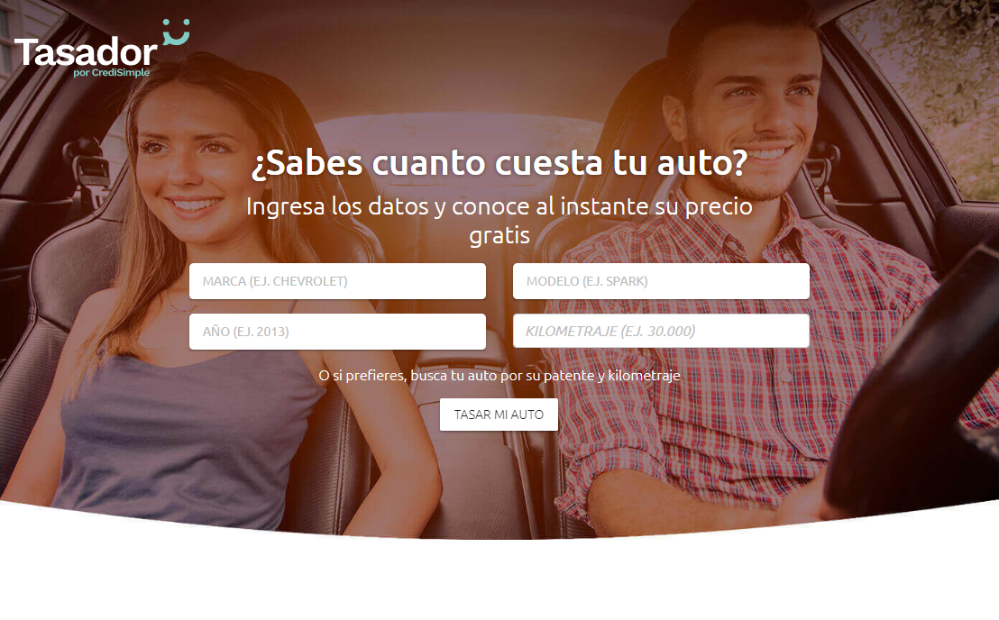
Vista de ingreso de Marca, Modelo, Año y Kilometraje

Como se puede observar en la Figura, las versiones son mostradas en cuadros donde se lista su información, que consiste en tipo transmisión, combustible, número de puertas, cilindrada, entre otros. Esto ayuda a que un usuario que no sabe exactamente su versión pueda inferirla a través de las características del vehículo que desea tasar. Para escoger una versión basta con seleccionarla con un click sobre ella lo que desencadena un cambio de vista y una solicitud POST al backend con el id de la versión escogida y el kilometraje ingresado, ya que solo esos dos datos son necesarios para realizar la tasación


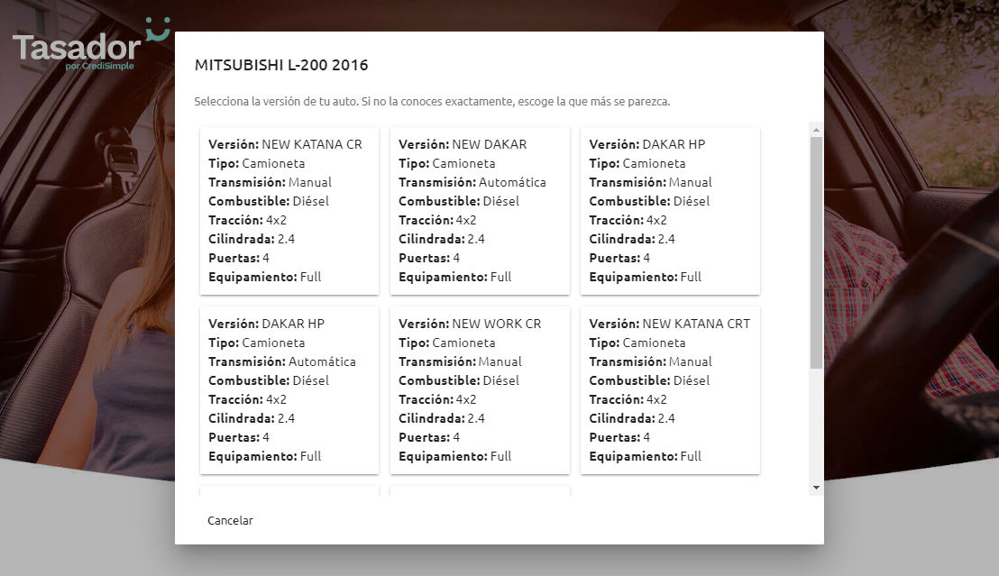
Vista de elección de versión específica

Al recibir respuesta del backend, se muestran los resultados como se ilustra en la Figura , donde se puede apreciar el nombre completo del auto buscado, el precio actual, un gráfico de su precio calculado a través de los años, un cuadro con las características del vehículo y un cuadro con los rangos de precios calculados. Finalmente, si se desea tasar otro auto, en la esquina superior derecha existe un botón que lleva a la vista anterior.


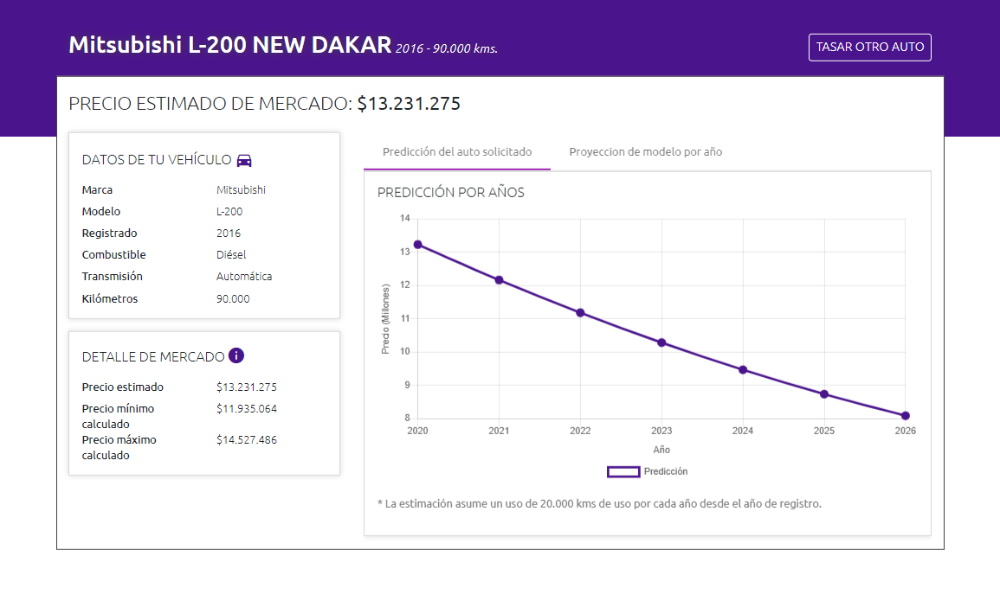
Vista de Resultados

[Return Contents](#0)
<hr/>
